In [1]:
library(readxl)
library(tidyverse)
library(stringr)
library(ggplot2)
library(gridExtra)
library(grid)
library(rjags)
library(coda)
library(tidyr)
library(dplyr)
library(RColorBrewer)
options(warn = -1)

── Attaching core tidyverse packages ──────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: coda

Linked to JAGS 4.3.2

Loaded modules: basemod,bugs



# IMPORT VECCHIO - NON USARE

In [2]:

# cambia directory

setwd("/home/samu/AdvStats/Project/Data")
files <- list.files(pattern = ".xlsx?$", full.names = TRUE)

process_file <- function(file_path) {
  file_name <- tools::file_path_sans_ext(basename(file_path))
  parts <- str_split(file_name, "_")[[1]]
  tipo <- parts[length(parts)]
  paese <- paste(parts[-length(parts)], collapse = "_")

  df <- read_excel(file_path, skip = 6)
  df <- df %>% filter(!is.na(Anno))
  metadata <- read_excel(file_path, n_max = 6 - 2, col_names = FALSE)

  df$paese <- paese
  df$tipo <- tipo

  return(df)
}

df_list <- lapply(files, process_file)
df_finale <- bind_rows(df_list)

cat("nrow:", nrow(df_finale), "\n")
cat("Pesi:", unique(df_finale$paese), "\n")
cat("Tipi:", unique(df_finale$tipo), "\n")
cat("Anni:", unique(df_finale$Anno), "\n") ### !!! 'Medio mensile' è considerato un anno, toglibile se da problemi
df_finale

df_finale_months <- df_finale |> select('GEN':'DIC')
df_finale$std <- apply(df_finale_months,1,sd)/(12)^0.5 # sd over rows
df_finale

#### Divide the dataframes for min, max and mean monthly averages

## version without 'Medio mensile'
df_anni <- df_finale %>% 
  filter(Anno != "Medio mensile") %>%
  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))

df_min <- df_anni %>% 
  filter(tipo == "min")
df_max <- df_anni %>% 
  filter(tipo == "max")
df_mean <- df_anni %>% 
  filter(tipo == "mean")


New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`
New names:
• `` -> `...1`


nrow: 372 
Pesi: Auronzo Castelfranco PortoTolle Roverchiara 
Tipi: max mean min 
Anni: 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023 Medio mensile 


Anno,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,paese,tipo
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1994,3.7,5.1,14.3,12.4,18.4,22.6,26.4,26.2,19.9,13.8,9.8,3.5,14.7,Auronzo,max
1995,1.7,6.3,8.2,14.5,18.0,19.8,26.7,22.5,17.5,17.4,7.3,1.6,13.5,Auronzo,max
1996,2.6,4.7,8.6,14.2,18.4,23.8,23.4,22.6,17.3,12.8,6.9,1.9,13.1,Auronzo,max
1997,4.6,7.2,13.4,13.7,19.3,20.5,23.6,24.1,22.8,15.3,7.6,2.3,14.5,Auronzo,max
1998,3.4,10.2,11.7,11.9,19.5,23.4,25.2,26.1,19.1,13.1,5.3,2.1,14.2,Auronzo,max
1999,3.2,4.9,10.5,14.7,19.8,21.7,24.6,23.6,21.0,14.5,5.9,0.8,13.8,Auronzo,max
2000,2.3,7.5,11.2,15.3,20.3,25.0,22.8,25.9,21.2,13.9,6.0,3.2,14.5,Auronzo,max
2001,2.6,7.4,10.7,13.1,22.0,22.1,24.9,26.3,16.2,16.7,6.6,0.7,14.1,Auronzo,max
2002,2.3,7.4,13.1,13.5,18.2,24.4,24.7,23.5,18.6,13.9,8.2,3.1,14.2,Auronzo,max


Anno,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,paese,tipo,std
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
1994,3.7,5.1,14.3,12.4,18.4,22.6,26.4,26.2,19.9,13.8,9.8,3.5,14.7,Auronzo,max,2.369539
1995,1.7,6.3,8.2,14.5,18.0,19.8,26.7,22.5,17.5,17.4,7.3,1.6,13.5,Auronzo,max,2.378230
1996,2.6,4.7,8.6,14.2,18.4,23.8,23.4,22.6,17.3,12.8,6.9,1.9,13.1,Auronzo,max,2.340034
1997,4.6,7.2,13.4,13.7,19.3,20.5,23.6,24.1,22.8,15.3,7.6,2.3,14.5,Auronzo,max,2.224394
1998,3.4,10.2,11.7,11.9,19.5,23.4,25.2,26.1,19.1,13.1,5.3,2.1,14.2,Auronzo,max,2.415747
1999,3.2,4.9,10.5,14.7,19.8,21.7,24.6,23.6,21.0,14.5,5.9,0.8,13.8,Auronzo,max,2.458884
2000,2.3,7.5,11.2,15.3,20.3,25.0,22.8,25.9,21.2,13.9,6.0,3.2,14.5,Auronzo,max,2.457626
2001,2.6,7.4,10.7,13.1,22.0,22.1,24.9,26.3,16.2,16.7,6.6,0.7,14.1,Auronzo,max,2.505402
2002,2.3,7.4,13.1,13.5,18.2,24.4,24.7,23.5,18.6,13.9,8.2,3.1,14.2,Auronzo,max,2.277973


# New Import

In [5]:
# cambia directory
#setwd("data_clone")
files <- list.files(pattern = "\\csv?$", full.names = TRUE)

process_file <- function(file_path) {
  file_name <- tools::file_path_sans_ext(basename(file_path))
  parts <- str_split(file_name, "_")[[1]]
  paese <- paste(parts[-length(parts)], collapse = "_")

  df <- read_csv(file_path, show_col_types = FALSE)
  df <- df %>% filter(!is.na(TMIN)) ##ho tolto i vari buchi soprattutto i 6 anni di castelfranco

  df$paese <- paese

  return(df)
}

df_list <- lapply(files, process_file)
df_import <- bind_rows(df_list)

#cat("nrow:", nrow(df_finale), "\n")
#cat("Paesi:", unique(df_finale$paese), "\n")
#cat("Anni:", unique(df_finale$date), "\n") ### !!! 'Medio mensile' è considerato un anno, toglibile se da problemi
df_94<-df_import%>%
      filter(year(date)>1993 & year(date)<2025)#%>%
      #rename(min = TMIN, mean = TMED, max = TMAX)

head(df_94)

date,TMIN,TMED,TMAX,paese
<date>,<dbl>,<dbl>,<dbl>,<chr>
1994-01-01,-6.1000,-2.1979,0.4000,Auronzo
1994-01-02,-12.7000,-7.5431,-2.3000,Auronzo
1994-01-03,-9.4407,-4.9648,2.1650,Auronzo
1994-01-04,-6.7956,-3.4558,-0.9134,Auronzo
1994-01-05,-2.9000,-0.0854,4.4000,Auronzo
1994-01-06,0.0000,0.9302,1.6000,Auronzo


In [6]:
df_month<- df_94 %>%
  mutate(Anno = year(date),
         Mese = month(date)) %>%
  group_by(paese, Anno, Mese) %>%
  summarise(
    min = mean(TMIN, na.rm = TRUE),
    mean = mean(TMED, na.rm = TRUE),
    max = mean(TMAX, na.rm = TRUE),
    .groups = "drop"
  )

df_long <- df_month%>%
  pivot_longer(cols = c(min, mean, max),
               names_to = "tipo",
               values_to = "valore")

mese_abb <- c("GEN", "FEB", "MAR", "APR", "MAG", "GIU", "LUG", "AGO", "SET", "OTT", "NOV", "DIC")
df_long <- df_long %>%
  mutate(mese_abb = mese_abb[Mese]) 

### to have months as columns
df_wide <- df_long %>%
  select(paese, Anno, tipo, mese_abb, valore) %>%
  pivot_wider(names_from = mese_abb, values_from = valore)

df_finale <- df_wide %>%
  rowwise() %>%
  mutate(Medio = mean(c_across(all_of(mese_abb)), na.rm = TRUE)) %>% # 2025 removed because there were problems with the averages 
  ungroup()

head(df_finale)

paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064


In [7]:
df_finale_months <- df_finale |> select('GEN':'DIC')
df_finale$std <- apply(df_finale_months,1,sd)/(12)^0.5 # sd over rows
head(df_finale)


paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,std
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995,1.766283
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837,2.112294
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319,2.382074
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853,1.915043
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163,2.141889
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064,2.376033


In [8]:
## version without 'Medio mensile'

df_anni <- df_finale %>% 
  filter(Anno != "Medio mensile") %>%
  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))

df_min <- df_anni %>% 
  filter(tipo == "min")
df_max <- df_anni %>% 
  filter(tipo == "max")
df_mean <- df_anni %>% 
  filter(tipo == "mean")

# Part 1)

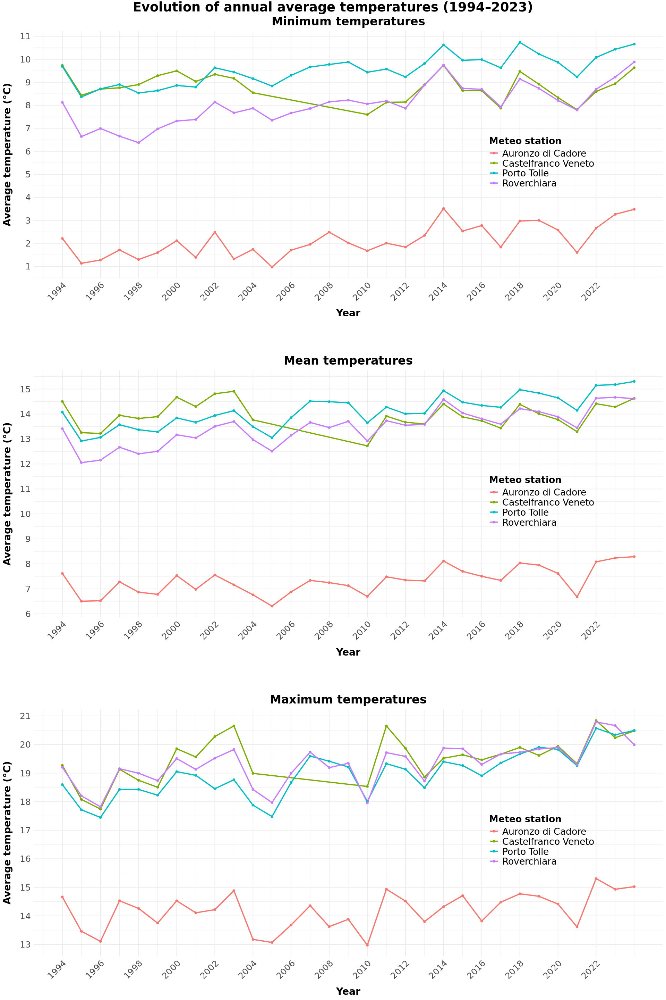

In [9]:

names_stat <- c("Roverchiara" = "Roverchiara", "Castelfranco" = "Castelfranco Veneto",
  "PortoTolle" = "Porto Tolle","Auronzo" = "Auronzo di Cadore")

plot_0 <- function(df, title, names) {
  ggplot(df, aes(x = Anno, y = Medio, color = paese)) +
    geom_line(size = 1) +
    geom_point() +
    scale_color_discrete(labels = names) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station"
    ) +
    theme_minimal() +
    scale_x_continuous(breaks = seq(1994, 2022, 2)) +
    scale_y_continuous(breaks = seq(0, 21, 1)) +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 15),
      axis.text.y = element_text(size = 15),
      axis.title.x = element_text(size = 17, margin = margin(t = 15),face="bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15),face="bold"),
      legend.position = c(0.8, 0.47),
      legend.title = element_text(size = 16,face="bold"),
      legend.text = element_text(size = 16)
    )
}


options(repr.plot.width = 16, repr.plot.height = 24)


min_plot <- plot_0(df_min, 'Minimum temperatures', names_stat)
mean_plot <- plot_0(df_mean, 'Mean temperatures', names_stat)
max_plot <- plot_0(df_max, 'Maximum temperatures', names_stat)

grid.arrange(
  min_plot, nullGrob(), mean_plot, nullGrob(), max_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023)', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"))
)

## 1.1)

In [10]:
#linear fit 

lin_fits <- list()
  
  for (i in names(names_stat)) {  
  df_min_i  <- df_min[df_min$paese == i,]
  df_mean_i <- df_mean[df_mean$paese == i,]
  df_max_i  <- df_max[df_max$paese == i,]
  
  if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
    cat("No data found for station:", i, "\n")
    next}

  lin_fit_min  <- lm(Medio ~ Anno, data = df_min_i,weights = 1/std^2)
  lin_fit_mean <- lm(Medio ~ Anno, data = df_mean_i,weights = 1/std^2)
  lin_fit_max  <- lm(Medio ~ Anno, data = df_max_i,weights = 1/std^2)

  lin_fits[[i]] <- list(
    min = lin_fit_min,
    mean = lin_fit_mean,
    max = lin_fit_max) }

lin_fits
    

$Roverchiara
$Roverchiara$min

Call:
lm(formula = Medio ~ Anno, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
 -141.93631      0.07468  


$Roverchiara$mean

Call:
lm(formula = Medio ~ Anno, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
 -117.78664      0.06534  


$Roverchiara$max

Call:
lm(formula = Medio ~ Anno, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  -82.95907      0.05091  



$Castelfranco
$Castelfranco$min

Call:
lm(formula = Medio ~ Anno, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
   31.03931     -0.01106  


$Castelfranco$mean

Call:
lm(formula = Medio ~ Anno, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  10.306411     0.001824  


$Castelfranco$max

Call:
lm(formula = Medio ~ Anno, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  -69.27094      0.04418  



$PortoTolle
$Por

In [11]:
lin_summary <- data.frame(
  paese = character(),
  temp = character(),
  intercept = numeric(),
  slope = numeric(),
  intercept_se = numeric(),
  slope_se = numeric(),
  r_squared = numeric(),
  p_value = numeric(),
  residual_se = numeric(),
  stringsAsFactors = FALSE)

for (i in names(lin_fits)) {
  for (stat in c("min", "mean", "max")) {
    fit <- lin_fits[[i]][[stat]]
    summary_fit <- summary(fit)

    lin_summary <- rbind(lin_summary, data.frame(
      paese = i,
      temp = stat,
      intercept = coef(fit)[1],
      slope = coef(fit)[2],
      intercept_se = coef(summary_fit)[, "Std. Error"][1],
      slope_se = coef(summary_fit)[, "Std. Error"][2],
      r_squared = summary_fit$r.squared,
      p_value = coef(summary_fit)[, "Pr(>|t|)"][2], # p-value tests the null hypothesis: fit slope=0
      residual_se = summary_fit$sigma),
      make.row.names = FALSE) }
}
lin_summary

paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,min,-141.93631,0.074675865,23.86580,0.011880217,0.576706823,7.295410e-07,0.3099477
Roverchiara,mean,-117.78664,0.065340335,17.44501,0.008683951,0.661272467,2.708450e-08,0.1918881
Roverchiara,max,-82.95907,0.050907708,22.40848,0.011153702,0.418043536,8.501852e-05,0.2153602
Castelfranco,min,31.03931,-0.011055101,24.93245,0.012409228,0.032010705,3.818393e-01,0.3040848
Castelfranco,mean,10.30641,0.001823974,22.27826,0.011087455,0.001126348,8.707090e-01,0.2428447
Castelfranco,max,-69.27094,0.044175337,26.56039,0.013215602,0.317666419,2.713628e-03,0.2648194
PortoTolle,min,-102.19146,0.055628842,17.40438,0.008664236,0.587029821,5.059492e-07,0.2195147
PortoTolle,mean,-103.29838,0.058457110,15.65242,0.007791516,0.659983310,2.864357e-08,0.1772794
PortoTolle,max,-122.77320,0.070558203,20.83553,0.010371243,0.614793380,1.806317e-07,0.2184067


The p-value tests the null hypothesis that the slope coefficient $b$ is compatibile with zero, meaning that there is no statistically significant correlation between the two variables. It is computed defyning the t-student variable:

$$t= \frac{\hat{b}}{\sigma_{\hat{b}}} $$ 

where $\hat{b}$ is the  estimator for the slope and $\sigma_{\hat{b}}$ is its standard deviation, and performing a two-sided hypothesis testing. In almost all cases we can reject the null hypothesis with a very high $CL > 99\%$, and thus claim there is a non zero (in this case positive) correlation between mean temperatures and time, with the exception for:
- Min and mean temperatures in Castelfranco Veneto: p-values = 0.38,0.87
- Max temperatures in Auronzo di Cadore: p-value = 0.03

In [12]:

years <- sort(unique(as.numeric(as.character(df_min$Anno))))

pred_df <- data.frame()
years <- unique(df_min$Anno)

for (i in 1:nrow(lin_summary)) {
  row <- lin_summary[i,]
  model <- lin_fits[[row$paese]][[row$temp]]

  df_stat <- switch(row$temp,
                    "min" = df_min,
                    "mean" = df_mean,
                    "max" = df_max)
  
  df_station <- df_stat[df_stat$paese == row$paese, ]
  
  # linear fit prediction 
  newdata <- data.frame(Anno = years)
  pred <- predict(model, newdata = newdata, se.fit = TRUE)
  
  # compute chi_squared 
  y_obs <- df_station$Medio
  y_pred_obs <- predict(model, newdata = df_station)
  y_err <- df_station$std
  
  chi_squared <- sum(((y_obs-y_pred_obs)^2)/(y_err^2), na.rm = TRUE)


  temp_df <- data.frame(
    paese = row$paese,
    temp = row$temp,
    Anno = years,
    prediction = pred$fit,
    prediction_se = pred$se.fit,
    chi_squared = chi_squared  # same value repeated for all rows
  )
  
  pred_df <- rbind(pred_df, temp_df)
}
pred_df

,paese,temp,Anno,prediction,prediction_se,chi_squared
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,1994,6.967371,0.2057352,2.785959
2,Roverchiara,min,1995,7.042047,0.1956436,2.785959
3,Roverchiara,min,1996,7.116722,0.1857636,2.785959
4,Roverchiara,min,1997,7.191398,0.1761309,2.785959
5,Roverchiara,min,1998,7.266074,0.1667883,2.785959
6,Roverchiara,min,1999,7.340750,0.1577874,2.785959
7,Roverchiara,min,2000,7.415426,0.1491901,2.785959
8,Roverchiara,min,2001,7.490102,0.1410701,2.785959
9,Roverchiara,min,2002,7.564778,0.1335146,2.785959


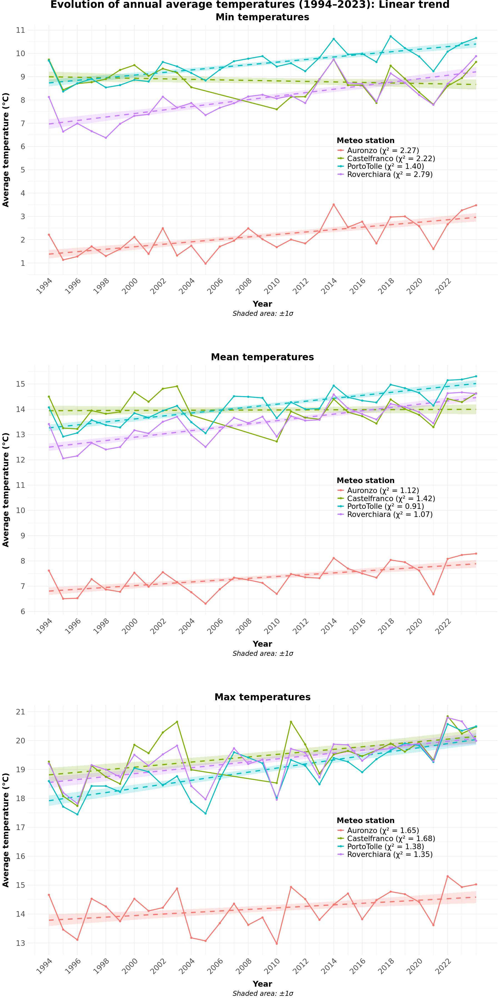

In [13]:
plot_1 <- function(df,pred_df,temp_type,title,names) {
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
    
  df$Medio <- as.numeric(as.character(df$Medio))
    
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  pred_df$prediction_se <- as.numeric(as.character(pred_df$prediction_se))
  chi_values <- pred_df |> group_by(paese) |> summarise(chi_squared=mean(chi_squared),.groups = "drop") 
  legend_labels <- setNames(
      sprintf("%s (χ² = %.2f)", chi_values$paese, chi_values$chi_squared),
      chi_values$paese)
    
  ggplot() +
    geom_ribbon(data = pred_df, aes(x=Anno, ymin=prediction-prediction_se, 
                                   ymax = prediction+prediction_se, fill = paese), alpha = 0.2, show.legend = FALSE) +
    geom_line(data = pred_df, aes(x=Anno, y=prediction, color = paese), size = 1.2, linetype = "dashed") +
    geom_line(data = df, aes(x=Anno, y=Medio, color=paese), size = 1) +
    geom_point(data = df, aes(x=Anno, y=Medio, color=paese)) +

    scale_color_discrete(labels = legend_labels) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station",
      fill=NULL,
      caption = "Shaded area: ±1σ"
    ) +
    scale_x_continuous(breaks = seq(1994, 2022, 2))+
    scale_y_continuous(breaks = seq(0, 21, 1))+
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.75, 0.47),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16),
      plot.caption = element_text(size = 14.5, hjust = 0.5, face = "italic"))
}


options(repr.plot.width = 15, repr.plot.height = 30)
min_lin_fit_plot <-plot_1(df_finale,pred_df,"min",'Min temperatures',names_stat)
mean_lin_fit_plot <-plot_1(df_finale,pred_df,"mean",'Mean temperatures',names_stat)
max_lin_fit_plot <-plot_1(df_finale,pred_df,"max",'Max temperatures',names_stat)

grid.arrange(
  min_lin_fit_plot, nullGrob(), mean_lin_fit_plot, nullGrob(), max_lin_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): Linear trend', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

We perform a $\chi^2$ test evaluate whether the observed data are consistent with a linear model. With 10 degrees of freedom and a $CL=95\%$ the critical value is $\chi^2_0\approx 18.3$, in all cases we obtain significantly lower $\chi^2$ values, thus we can claim that mean temperatures data for all stations are highly consistent with a linear trend model (p-value > 0.986).

In [14]:
p_value_chi <- 1- pchisq(2.79,10)
p_value_chi

[1] 0.9859431

## 1.2)

We will use the results of this linear regression as prior for a Bayesian linear regression with JAGS.

In [15]:
head(lin_summary)

,paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,-141.93631,0.074675865,23.86580,0.011880217,0.576706823,7.295410e-07,0.3099477
2,Roverchiara,mean,-117.78664,0.065340335,17.44501,0.008683951,0.661272467,2.708450e-08,0.1918881
3,Roverchiara,max,-82.95907,0.050907708,22.40848,0.011153702,0.418043536,8.501852e-05,0.2153602
4,Castelfranco,min,31.03931,-0.011055101,24.93245,0.012409228,0.032010705,3.818393e-01,0.3040848
5,Castelfranco,mean,10.30641,0.001823974,22.27826,0.011087455,0.001126348,8.707090e-01,0.2428447
6,Castelfranco,max,-69.27094,0.044175337,26.56039,0.013215602,0.317666419,2.713628e-03,0.2648194


In [16]:
prior_min <- lin_summary[which(lin_summary$temp == "min"),]
prior_mean <- lin_summary[which(lin_summary$temp == "mean"),]
prior_max <- lin_summary[which(lin_summary$temp == "max"),]


In [17]:
as.numeric(prior_min[1,3:6])
prior_min

[1] -141.93630515    0.07467587   23.86580246    0.01188022

,paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,-141.93631,0.07467587,23.86580,0.011880217,0.57670682,7.295410e-07,0.3099477
4,Castelfranco,min,31.03931,-0.01105510,24.93245,0.012409228,0.03201071,3.818393e-01,0.3040848
7,PortoTolle,min,-102.19146,0.05562884,17.40438,0.008664236,0.58702982,5.059492e-07,0.2195147
10,Auronzo,min,-103.58489,0.05263996,21.26534,0.010585072,0.46027538,2.734046e-05,0.2799797


In [80]:
# JAGS models

jags_model <- "
model {
  for (i in 1:N) {
    y[i] ~ dnorm(mu[i], tau)
    mu[i] <- a + b * x[i]
  }
  
  # priors (parameters from linear regression above)
  a ~ dnorm(mu_a, tau_a)
  b ~ dnorm(mu_b, tau_b)
  tau <- pow(sigma, -2)  
  sigma ~ dunif(0, 100)}"

jags_model_constant <- "model {
  for (i in 1:N) {
    y[i] ~ dnorm(mu[i], tau)
    mu[i] <- a}
  
  # priors (parameters from linear regression above)
  a ~ dnorm(mu_a, tau_a)
  tau <- pow(sigma, -2)  
  sigma ~ dunif(0, 100) }"

# variables
n.burnin <- 1000
n.chains <- 5
n.iter <- 20000

jags_analysis <- function(model_type,df_min, df_mean, df_max,
                          prior_min, prior_mean, prior_max,
                          names_stat,
                          n.chains = 3,
                          n.burnin = 1000,
                          n.iter = 5000){
   
    if (model_type == "constant") {
    model_string <- jags_model_constant} 
    else if (model_type == "linear") {
    model_string <- jags_model}  # your original model

    samples_jags_min <- data.frame() # to store generataed samples
    samples_jags_mean <- data.frame()
    samples_jags_max <- data.frame()

    pred_jags_min <- data.frame()
    pred_jags_mean <- data.frame()
    pred_jags_max <- data.frame()
    
    for (i in names(names_stat)) {  
        # retrieve data
        df_min_i  <- df_min[df_min$paese == i,]
        df_mean_i <- df_mean[df_mean$paese == i,]
        df_max_i  <- df_max[df_max$paese == i,]
        
        years <- unique(df_min_i$Anno)  
        years <- as.numeric(years) 

         prio_min <- prior_min[prior_min$paese == i, ]
        prio_mean <- prior_mean[prior_mean$paese == i, ]
        prio_max <- prior_max[prior_max$paese == i, ]
  
        # retrieve correct prior
        if (model_type == "constant") {
          prior_list_min <- list(
            mu_a = prio_min$intercept,
            tau_a = 1 / (prio_min$intercept_se^2) )
          prior_list_mean <- list(
            mu_a = prio_mean$intercept,
            tau_a = 1/prio_mean$intercept_se^2)
          prior_list_max <- list(
            mu_a = prio_max$intercept,
            tau_a = 1/prio_max$intercept_se^2)} 
        
        else if (model_type == "linear") {
          prior_list_min <- list(
            mu_a = prio_min$intercept, 
            tau_a = 1/prio_min$intercept_se^2, 
            mu_b = prio_min$slope, 
            tau_b = 1/prio_min$slope_se^2)
          prior_list_mean <- list(
            mu_a = prio_mean$intercept, 
            tau_a = 1/prio_mean$intercept_se^2, 
            mu_b = prio_mean$slope, 
            tau_b = 1/prio_mean$slope_se^2)
          prior_list_max <- list(
            mu_a = prio_max$intercept, 
            tau_a = 1/prio_max$intercept_se^2, 
            mu_b = prio_max$slope, 
            tau_b = 1/prio_max$slope_se^2
          )}
        
        # handle missing data
        if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
            cat("No data found for station:", i, "\n")
            next}
    
        
        # get x (anno) and y (temperatures) and std
        x_min <- as.numeric(df_min_i$Anno)
        x_mean <- as.numeric(df_mean_i$Anno)
        x_max <- as.numeric(df_max_i$Anno)
    
        y_min <- as.numeric(df_min_i$Medio)
        y_mean <- as.numeric(df_mean_i$Medio)
        y_max <- as.numeric(df_max_i$Medio)
    
        y_err_min <- as.numeric(df_min_i$std)
        y_err_mean <- as.numeric(df_mean_i$std)
        y_err_max <- as.numeric(df_max_i$std)
    
        # convert to jags data (list)
        jags_data_min <- list(x = x_min, y = y_min, N = length(y_min))
        jags_data_mean <- list(x = x_mean, y = y_mean, N = length(y_mean))
        jags_data_max <- list(x = x_max, y = y_max, N = length(y_max))
    
        # chain the priors
        jags_data_min_full <- c(jags_data_min, prior_list_min)
        jags_data_mean_full <- c(jags_data_mean, prior_list_mean)
        jags_data_max_full <- c(jags_data_max, prior_list_max)
    
        # inits and param

        if (model_type == "constant") {
        inits <- function() list(a = 0, sigma = 1)
        params <- c("a", "sigma")
        } else {
         inits <- function() list(a = 0, b = 0, sigma = 1)
         params <- c("a", "b", "sigma")}
      
        
        ##################################################################
        # run JAGS model (MIN)
        model_jags_min <- jags.model(textConnection(model_string),
                                   data = jags_data_min_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_min, n.burnin, progress.bar="none")  # burn-in
        samples_min <- coda.samples(model_jags_min, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_min <- as.matrix(samples_min)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_min <- data.frame(
        a = samples_mat_min[, "a"],
        sigma = samples_mat_min[, "sigma"],
        paese = i)} 
        else {
        samples_df_min <- data.frame(
        a = samples_mat_min[, "a"],
        b = samples_mat_min[, "b"],
        sigma = samples_mat_min[, "sigma"],
        paese = i)}
        
        samples_jags_min <- rbind(samples_jags_min, samples_df_min)
    
        ##################################################################
        # run JAGS model (MEAN)
        model_jags_mean <- jags.model(textConnection(model_string),
                                   data = jags_data_mean_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_mean, n.burnin, progress.bar="none")  # burn-in
        samples_mean <- coda.samples(model_jags_mean, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_mean <- as.matrix(samples_mean)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_mean <- data.frame(
        a = samples_mat_mean[, "a"],
        sigma = samples_mat_mean[, "sigma"],
        paese = i)} 
        else {
        samples_df_mean <- data.frame(
        a = samples_mat_mean[, "a"],
        b = samples_mat_mean[, "b"],
        sigma = samples_mat_mean[, "sigma"],
        paese = i)}
        
        samples_jags_mean <- rbind(samples_jags_mean, samples_df_mean)
    
        #########################################
        # run JAGS model (MAX)
        model_jags_max <- jags.model(textConnection(model_string),
                                   data = jags_data_max_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_max, n.burnin, progress.bar="none")  # burn-in
        samples_max <- coda.samples(model_jags_max, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_max <- as.matrix(samples_max)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_max <- data.frame(
        a = samples_mat_max[, "a"],
        sigma = samples_mat_max[, "sigma"],
        paese = i)} 
        else {
        samples_df_max <- data.frame(
        a = samples_mat_max[, "a"],
        b = samples_mat_max[, "b"],
        sigma = samples_mat_max[, "sigma"],
        paese = i)}
        samples_jags_max <- rbind(samples_jags_max, samples_df_max)
       
        ########################################
        # average on predicitons 
       
        a_post_min <- mean(samples_mat_min[, "a"])
        sigma_post_min <- mean(samples_mat_min[, "sigma"])
        pred_se_min <- rep(sigma_post_min, length(years))
        
        if (model_type == "constant") {
          pred_min <- rep(a_post_min, length(years))
          y_pred_obs_min <- rep(a_post_min, length(x_min))
          b_post_min <- NA
        } else {
          b_post_min <- mean(samples_mat_min[, "b"])
          pred_min <- a_post_min + b_post_min * years
          y_pred_obs_min <- a_post_min + b_post_min * x_min
        }
        chi_squared_min <- sum(((y_min - y_pred_obs_min)^2) / (y_err_min^2), na.rm = TRUE)
        
         # mean
        a_post_mean <- mean(samples_mat_mean[, "a"])
        sigma_post_mean <- mean(samples_mat_mean[, "sigma"])
        pred_se_mean <- rep(sigma_post_mean, length(years))
        
        if (model_type == "constant") {
          pred_mean <- rep(a_post_mean, length(years))
          y_pred_obs_mean <- rep(a_post_mean, length(x_mean))
          b_post_mean <- NA
        } else {
          b_post_mean <- mean(samples_mat_mean[, "b"])
          pred_mean <- a_post_mean + b_post_mean * years
          y_pred_obs_mean <- a_post_mean + b_post_mean * x_mean
        }
        chi_squared_mean <- sum(((y_mean - y_pred_obs_mean)^2) / (y_err_mean^2), na.rm = TRUE)
        
        # max 
        a_post_max <- mean(samples_mat_max[, "a"])
        sigma_post_max <- mean(samples_mat_max[, "sigma"])
        pred_se_max <- rep(sigma_post_max, length(years))
        
        if (model_type == "constant") {
          pred_max <- rep(a_post_max, length(years))
          y_pred_obs_max <- rep(a_post_max, length(x_max))
          b_post_max <- NA
        } else {
          b_post_max <- mean(samples_mat_max[, "b"])
          pred_max <- a_post_max + b_post_max * years
          y_pred_obs_max <- a_post_max + b_post_max * x_max
        }
        chi_squared_max <- sum(((y_max - y_pred_obs_max)^2) / (y_err_max^2), na.rm = TRUE)
            
        
        # make dataframes
       
        temp_df_min <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_min,
            prediction_se = pred_se_min,
            chi_squared = chi_squared_min)
        temp_df_mean <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_mean,
            prediction_se = pred_se_mean,
            chi_squared = chi_squared_mean
        )
        temp_df_max <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_max,
            prediction_se = pred_se_max,
            chi_squared = chi_squared_max
        )
    
        # merge stations
        pred_jags_min <- rbind(pred_jags_min, temp_df_min)
        pred_jags_mean <- rbind(pred_jags_mean, temp_df_mean)
        pred_jags_max <- rbind(pred_jags_max, temp_df_max) }

    return(list(
        pred_jags_min = pred_jags_min,
        pred_jags_mean = pred_jags_mean,
        pred_jags_max = pred_jags_max,
        samples_jags_min = samples_jags_min,
        samples_jags_mean = samples_jags_mean,
        samples_jags_max = samples_jags_max
    )) }


In [81]:
results <- jags_analysis(
    model_type = "linear",
  df_min = df_min,
  df_mean = df_mean,
  df_max = df_max,
  prior_min = prior_min,
  prior_mean = prior_mean,
  prior_max = prior_max,
  names_stat = names_stat,
  n.chains = n.chains,
  n.burnin = n.burnin,
  n.iter = n.iter
)
results

paese,Anno,prediction,prediction_se,chi_squared
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,1994,7.339762,0.62834,3.334671
Roverchiara,1995,7.386460,0.62834,3.334671
Roverchiara,1996,7.433158,0.62834,3.334671
Roverchiara,1997,7.479855,0.62834,3.334671
Roverchiara,1998,7.526553,0.62834,3.334671
Roverchiara,1999,7.573251,0.62834,3.334671
Roverchiara,2000,7.619948,0.62834,3.334671
Roverchiara,2001,7.666646,0.62834,3.334671
Roverchiara,2002,7.713344,0.62834,3.334671


We can take the generated parameters and make probabilistic considerations

In [24]:
all_staz <- unique(results$samples_jags_mean$paese)

for (staz in all_staz) {
    masked <- results$samples_jags_mean[results$samples_jags_mean$paese == staz, ]
    b <- masked$b
    cat('For zone', staz, 'probability of positive trend for mean temperatures is', mean(b > 0) * 100, '%\n')
}

For zone Roverchiara probability of positive trend for mean temperatures is 100 %
For zone Castelfranco probability of positive trend for mean temperatures is 31.616 %
For zone PortoTolle probability of positive trend for mean temperatures is 100 %
For zone Auronzo probability of positive trend for mean temperatures is 100 %


We can also check histogram to see parameters' posterior distributions based on the zone:

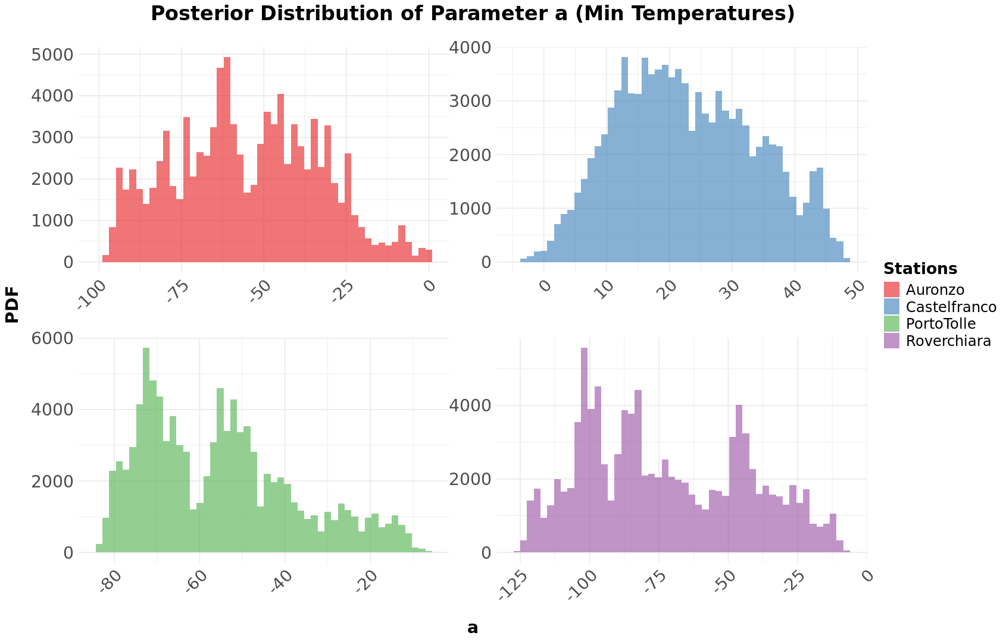

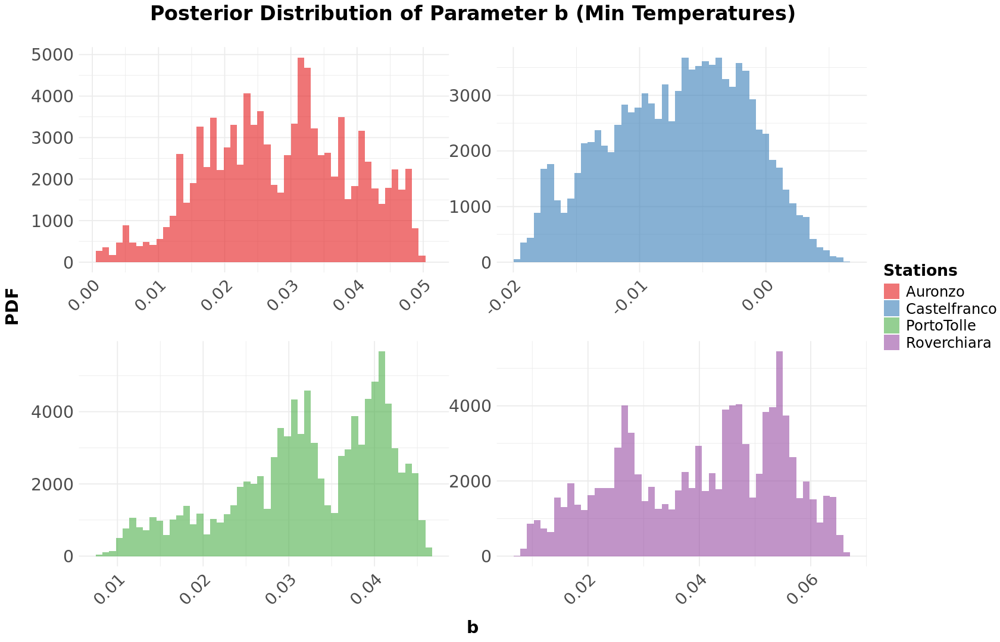

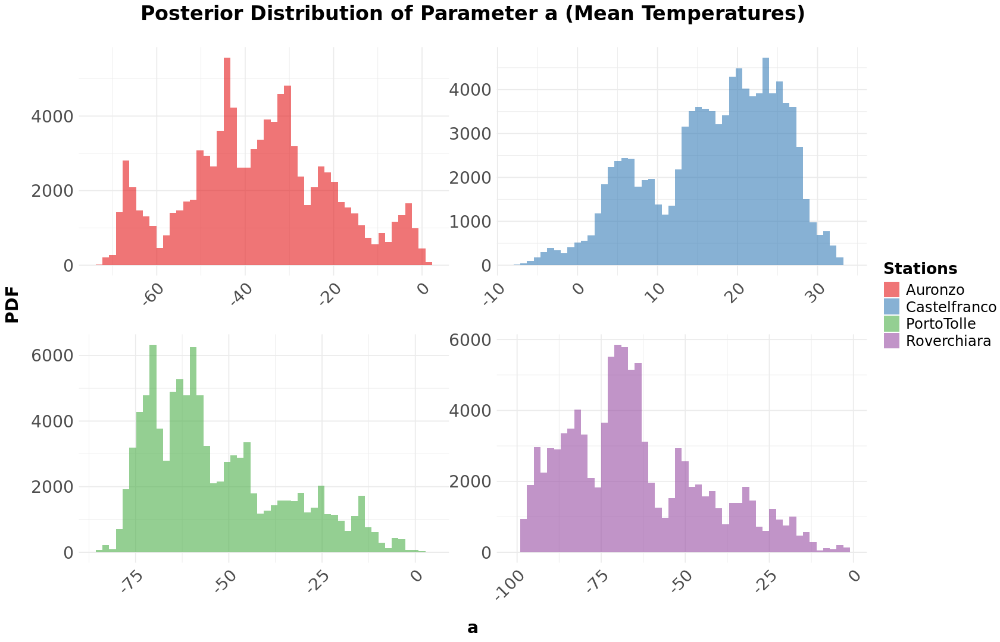

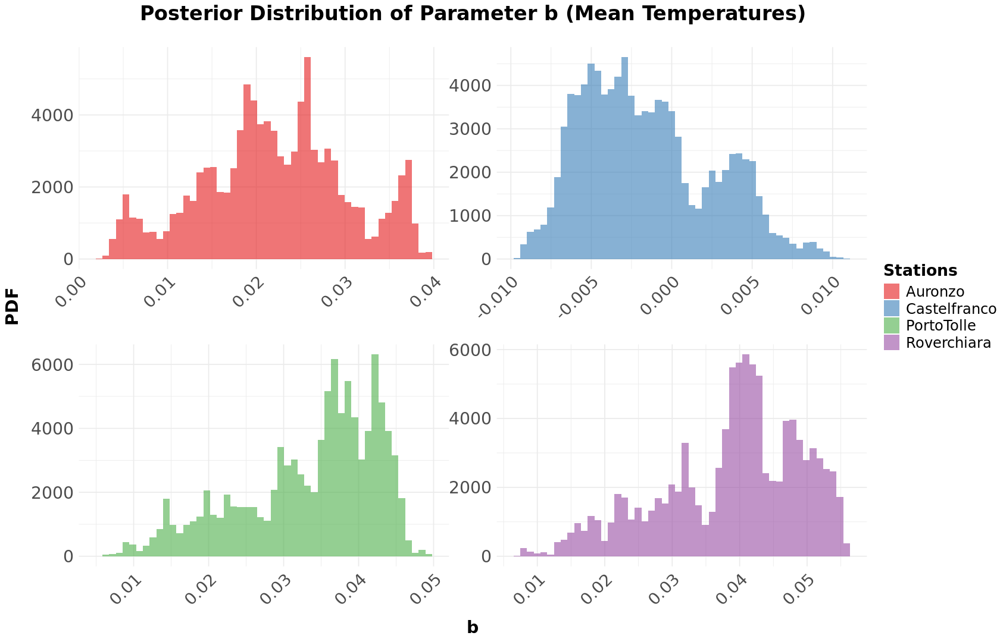

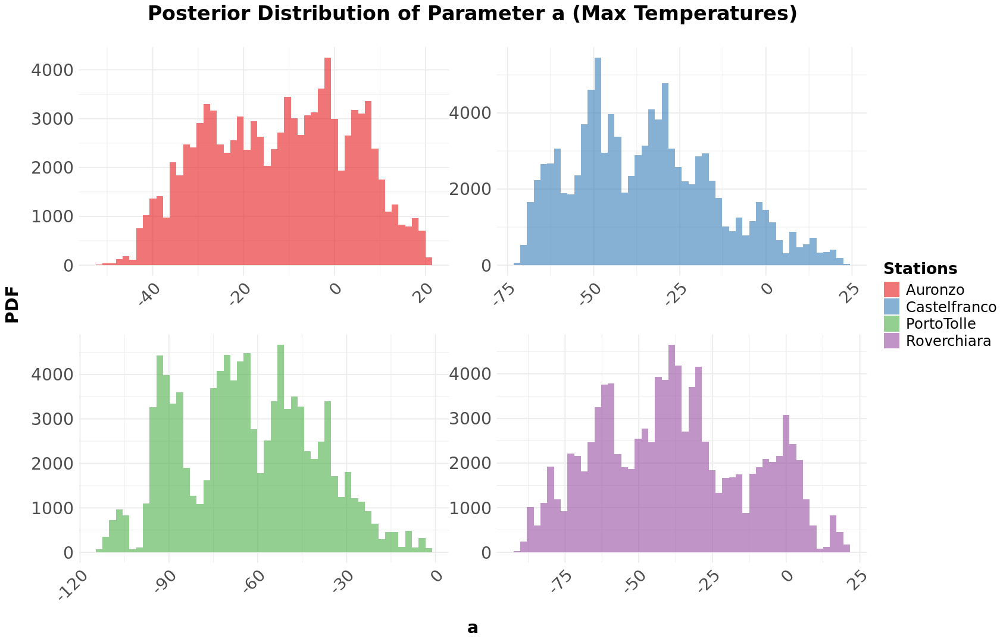

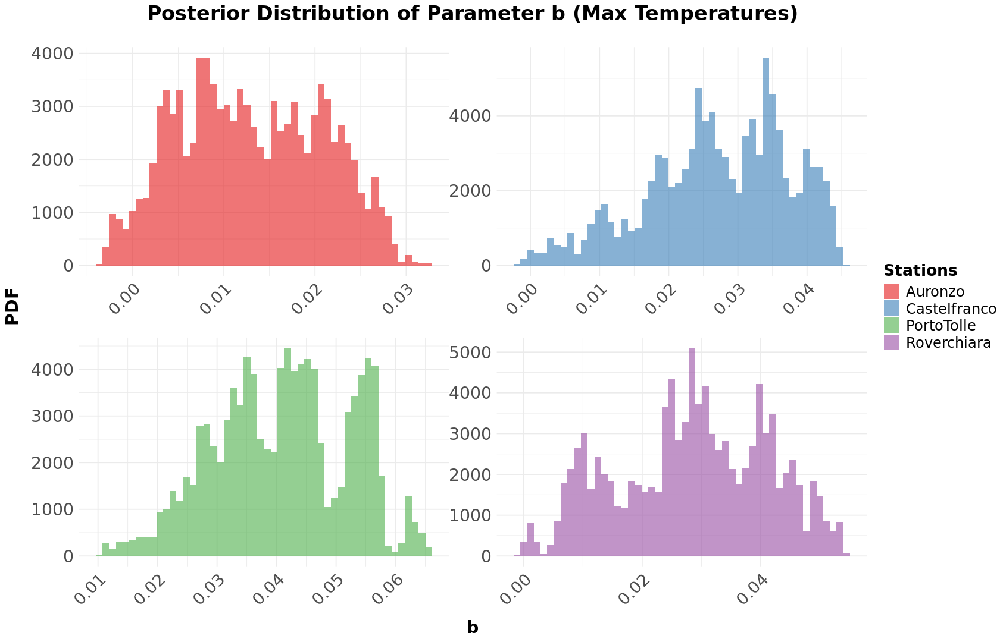

In [25]:
samples_long_min <- results$samples_jags_min %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_mean <- results$samples_jags_mean %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_max <- results$samples_jags_max %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")


options(repr.plot.width = 14, repr.plot.height=9)


theme_custom <- theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 17),
    axis.text.y = element_text(size = 17),
    axis.title.x = element_text(size = 17, face = "bold", margin = margin(t = 15)),
    axis.title.y = element_text(size = 17, face = "bold", margin = margin(r = 15)),
   # strip.text = element_text(size = 16, face = "bold"),
    legend.title = element_text(size = 16, face = "bold"),
    legend.text = element_text(size = 14.5)
  )

ggplot(filter(samples_long_min, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.6, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Min Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_min, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.6, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Min Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")


ggplot(filter(samples_long_mean, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.6, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Mean Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_mean, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.6, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Mean Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")


ggplot(filter(samples_long_max, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.6, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Max Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_max, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.6, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Max Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

Plot with Bayesian confidence level

In [26]:
 pred_jags_min<-results$pred_jags_min
pred_jags_mean<-results$pred_jags_mean
pred_jags_max<-results$pred_jags_max

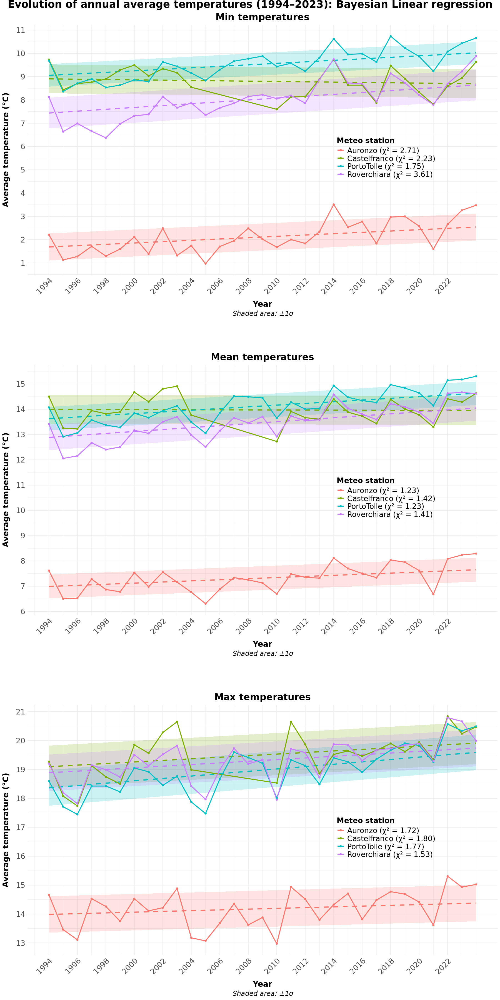

In [27]:
pred_jags_min$temp_type <- "min"
pred_jags_mean$temp_type <- "mean"
pred_jags_max$temp_type <- "max"   # merge the dataframes
pred_jags <- rbind(pred_jags_min, pred_jags_mean, pred_jags_max)

options(repr.plot.width = 15, repr.plot.height = 30)
min_lin_fit_plot <-plot_1(df_finale,pred_jags,"min",'Min temperatures',names_stat)
mean_lin_fit_plot <-plot_1(df_finale,pred_jags,"mean",'Mean temperatures',names_stat)
max_lin_fit_plot <-plot_1(df_finale,pred_jags,"max",'Max temperatures',names_stat)

grid.arrange(
  min_lin_fit_plot, nullGrob(), mean_lin_fit_plot, nullGrob(), max_lin_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): Bayesian Linear regression', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

## 1.3)

We now perform a constant regression analysis with JAGS to compare the two models with a Bayesian hypothesis testing. 

In [82]:
prior_min_const <- prior_min
prior_min_const$slope <- 0
prior_min_const$slope_se <- 1e6  # very vague prior on slope

prior_mean_const <- prior_mean
prior_mean_const$slope <- 0
prior_mean_const$slope_se <- 1e6

prior_max_const <- prior_max
prior_max_const$slope <- 0
prior_max_const$slope_se <- 1e6


const_results <- jags_analysis(
  model_type = "constant",
  df_min = df_min,
  df_mean = df_mean,
  df_max = df_max,
  prior_min = prior_min_const,
  prior_mean = prior_mean_const,
  prior_max = prior_max_const,
  names_stat = names_stat,
  n.chains = n.chains,
  n.burnin = n.burnin,
  n.iter = n.iter
)

const_results

paese,Anno,prediction,prediction_se,chi_squared
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,1994,8.029872,0.9013252,6.600093
Roverchiara,1995,8.029872,0.9013252,6.600093
Roverchiara,1996,8.029872,0.9013252,6.600093
Roverchiara,1997,8.029872,0.9013252,6.600093
Roverchiara,1998,8.029872,0.9013252,6.600093
Roverchiara,1999,8.029872,0.9013252,6.600093
Roverchiara,2000,8.029872,0.9013252,6.600093
Roverchiara,2001,8.029872,0.9013252,6.600093
Roverchiara,2002,8.029872,0.9013252,6.600093


In [31]:
plot_constant_fit <- function(df, pred_df, temp_type, title, names_stat) {
    
  # filter by temp type
    
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp_type == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
  df$Medio <- as.numeric(as.character(df$Medio))
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  pred_df$prediction_se <- as.numeric(as.character(pred_df$prediction_se))
  

  chi_values <- pred_df |>
    group_by(paese) |>
    summarise(chi_squared = mean(chi_squared), .groups = "drop")
  
  legend_labels <- setNames(
    sprintf("%s (χ² = %.2f)", chi_values$paese, chi_values$chi_squared),
    chi_values$paese
  )
  
  ggplot() +
    # shaded ribbon for ±1σ
    geom_ribbon(data = pred_df, aes(x = Anno, ymin = prediction - prediction_se,
                                    ymax = prediction + prediction_se, fill = paese),alpha = 0.2, show.legend = FALSE) +
    # constant prediction line
    geom_line(data = pred_df, aes(x = Anno, y = prediction, color = paese), 
              size = 1.2, linetype = "dashed") +
    
    geom_line(data = df, aes(x = Anno, y = Medio, color = paese), size = 1) +
    geom_point(data = df, aes(x = Anno, y = Medio, color = paese)) +
    
    scale_color_discrete(labels = legend_labels) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station",
      fill = NULL,
      caption = "Shaded area: ±1σ") +
    
    scale_x_continuous(breaks = seq(1994, 2023, 2)) +
    scale_y_continuous(breaks = seq(0, 21, 1)) +
    
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.8, 0.47),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16),
      plot.caption = element_text(size = 14, hjust = 0.5, face = "italic")) }


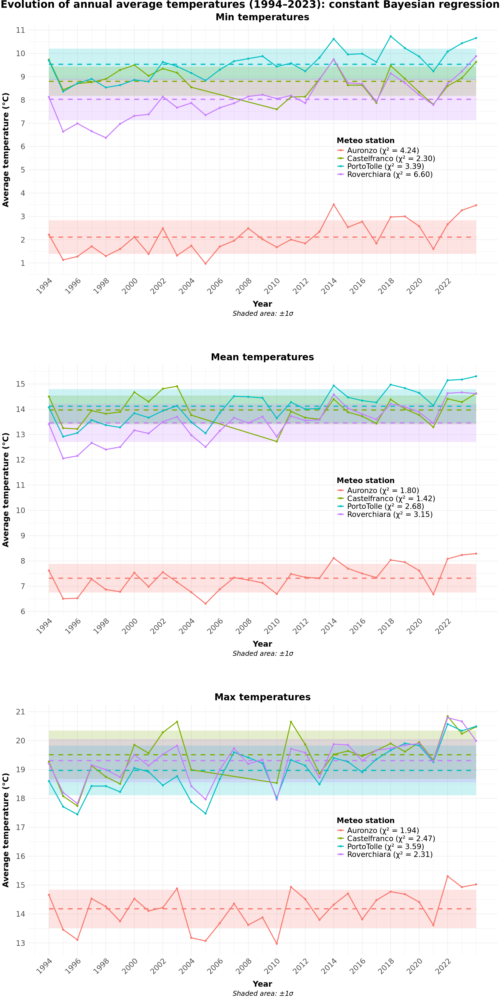

In [32]:
const_results$pred_jags_min$temp_type <- "min"
const_results$pred_jags_mean$temp_type <- "mean"
const_results$pred_jags_max$temp_type <- "max"

const_results$pred_jags <- rbind(
  const_results$pred_jags_min, 
  const_results$pred_jags_mean, 
  const_results$pred_jags_max)

options(repr.plot.width = 15, repr.plot.height = 30)

min_const_fit_plot <- plot_1(df_finale,const_results$pred_jags,"min","Min temperatures",  names_stat)
mean_const_fit_plot <-plot_1(df_finale,const_results$pred_jags,"mean",'Mean temperatures',names_stat)
max_const_fit_plot <-plot_1(df_finale,const_results$pred_jags,"max",'Max temperatures',names_stat)

grid.arrange(min_const_fit_plot, nullGrob(), mean_const_fit_plot, nullGrob(), max_const_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): constant Bayesian regression', gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" ))

## 1.4)

We now perform a Bayesian hypothesis testing with the posteriors obtained. The null hypothesis $H_0$ is the constant model, while the alternative hypothesis $H_1$ is the increasing linear trend. We can proceed in two ways.

- First, in the linear model, we compute a 95% confidence interval for the posterior of the slope b to test the null hypothesis $b=0$.

In [51]:
##

lower_lims_min <- results$samples_jags_min |> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_min <- results$samples_jags_min |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))

lower_lims_mean <- results$samples_jags_mean|> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_mean  <- results$samples_jags_mean |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))


lower_lims_max <- results$samples_jags_max |> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_max <- results$samples_jags_max |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))


lower_lims <- bind_rows("min"=lower_lims_min,'mean'=lower_lims_mean,"max"=lower_lims_max,.id='type')
upper_lims <- bind_rows("min"=upper_lims_min,'mean'=upper_lims_mean,"max"=upper_lims_max,.id='type')

lower_lims
upper_lims

type,paese,lower_lim
<chr>,<chr>,<dbl>
min,Auronzo,0.006357033
min,Castelfranco,-0.017562428
min,PortoTolle,0.012066296
min,Roverchiara,0.012356025
mean,Auronzo,0.005237301
mean,Castelfranco,-0.007706767
mean,PortoTolle,0.013436099
mean,Roverchiara,0.015771840
max,Auronzo,-0.000798029


type,paese,upper_lim
<chr>,<chr>,<dbl>
min,Auronzo,0.047534051
min,Castelfranco,0.002584718
min,PortoTolle,0.044726371
min,Roverchiara,0.063286516
mean,Auronzo,0.037178410
mean,Castelfranco,0.006784943
mean,PortoTolle,0.045385503
mean,Roverchiara,0.054179594
max,Auronzo,0.027141792


With the exception of minimum and mean temperatures in Castelfranco and maximum temperatures in Auronzo, $b=0$ is not included in the confidence interval and thus in such cases we can reject the null hypothess of the constant model, at significance $\alpha=5\%$.

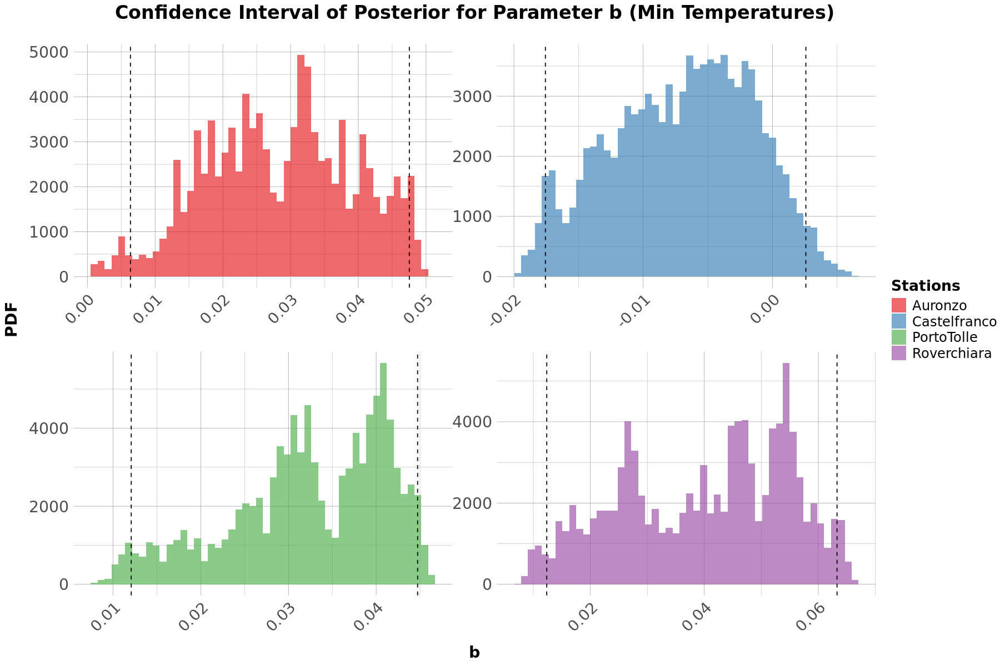

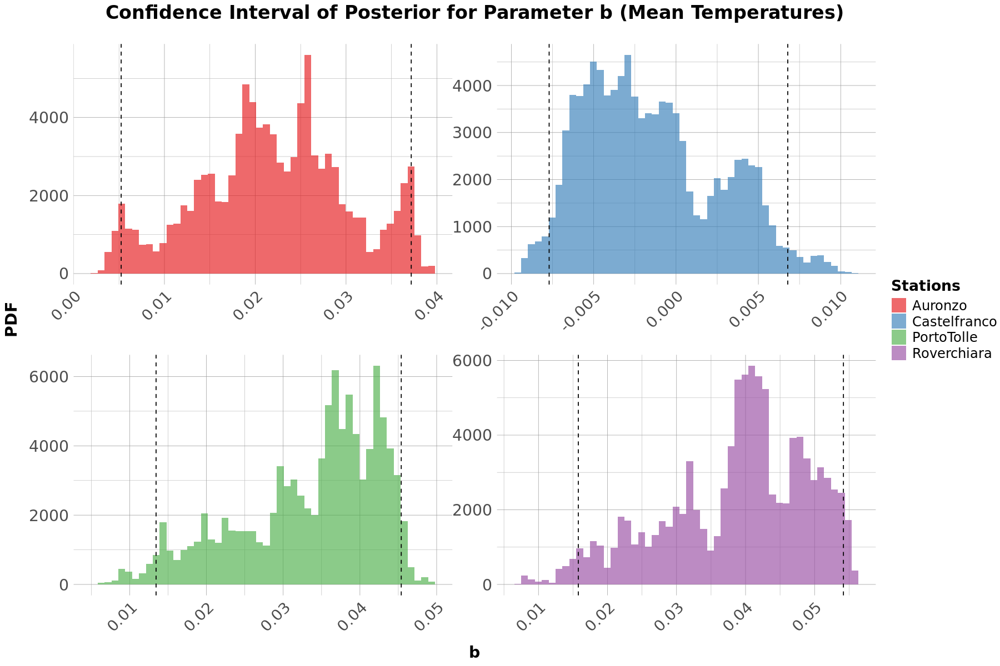

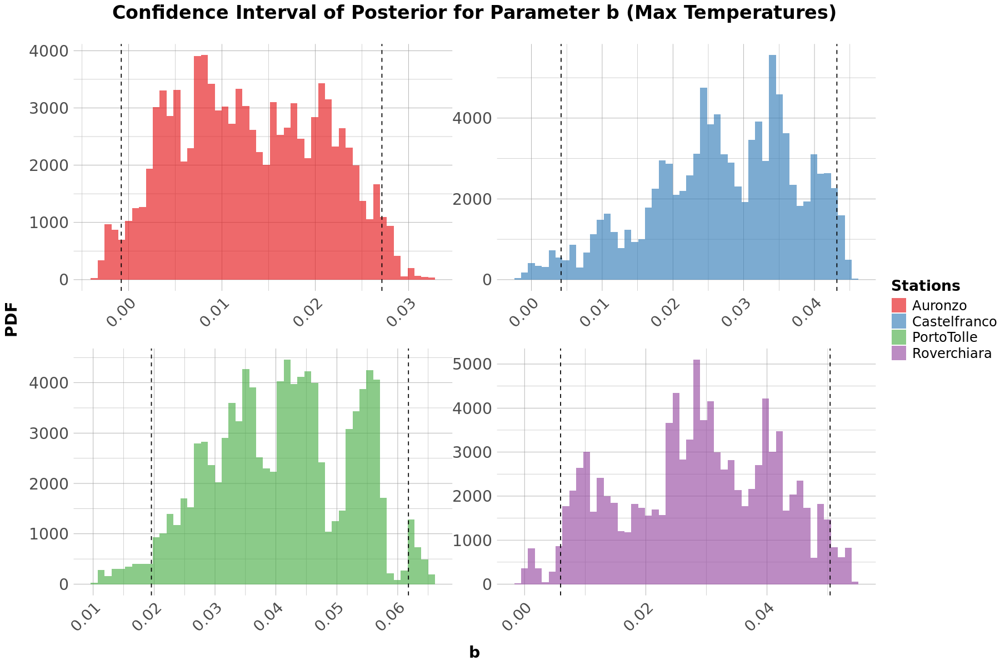

In [61]:
samples_long_min <- results$samples_jags_min %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_mean <- results$samples_jags_mean %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_max <- results$samples_jags_max %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")


theme_custom <- theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 17),
    axis.text.y = element_text(size = 17),
    axis.title.x = element_text(size = 17, face = "bold", margin = margin(t = 15)),
    axis.title.y = element_text(size = 17, face = "bold", margin = margin(r = 15)),
    legend.title = element_text(size = 16, face = "bold"),
    legend.text = element_text(size = 14.5),
    
    # grid lines
    panel.grid.major = element_line(color = "grey60", size = 0.2),
    panel.grid.minor = element_line(color = "grey75", size = 0.2))



options(repr.plot.width = 15, repr.plot.height=10)


ggplot(filter(samples_long_min, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "min"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "min"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Min Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

                                                           
ggplot(filter(samples_long_mean, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "mean"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "mean"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Mean Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")
                                                           

ggplot(filter(samples_long_max, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "max"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "max"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Max Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

- Another way to proceed is to compute the Bayes factor for the two models:
$$ BF = \frac{P(Data|H_1)}{P(Data|H_0)}$$

where we compute the likelihoods assuming a distribution $N(a+bx,\sigma^2)$ for $H_1$ and $N(a,\sigma^2)$ for $H_0$.

In [113]:
log_lik_sample <- function(a, b, sigma2, x, y) {
  x <- as.numeric(x)
  y <- as.numeric(y)
  mu <- a+ b*x
  sum(dnorm(y, mean = mu, sd = sqrt(sigma2),log = TRUE))
}

log_lik_sample_const <- function(a, sigma2, y) {
  y <- as.numeric(y)
  mu <- rep(a, length(y))
  sum(dnorm(y, mean = mu, sd = sqrt(sigma2),log = TRUE))
}


samples_linear_min <- as.data.frame(results$samples_jags_min)   
samples_const_min  <- as.data.frame(const_results$samples_jags_min)

samples_linear_min <- samples_linear_min |> filter(sigma>0)
samples_const_min <- samples_const_min |> filter(sigma>0)

samples_linear_mean <- as.data.frame(results$samples_jags_mean)   
samples_const_mean  <- as.data.frame(const_results$samples_jags_mean)

samples_linear_mean <- samples_linear_mean |> filter(sigma>0)
samples_const_mean <- samples_const_mean |> filter(sigma>0)

samples_linear_max <- as.data.frame(results$samples_jags_max)   
samples_const_max  <- as.data.frame(const_results$samples_jags_max)

samples_linear_max <- samples_linear_max |> filter(sigma>0)
samples_const_max <- samples_const_max |> filter(sigma>0)



library(purrr)

stations <- unique(samples_linear_min$paese)
bf_results <- list()

for (st in stations) {
  
  s_lin_min   <- samples_linear_min |> filter(paese == st)
  s_const_min <- samples_const_min  |> filter(paese == st)

  s_lin_mean   <- samples_linear_mean |> filter(paese == st)
  s_const_mean <- samples_const_mean  |> filter(paese == st)

  s_lin_max   <- samples_linear_max |> filter(paese == st)
  s_const_max <- samples_const_max  |> filter(paese == st)

  df_station_min  <- df_min  |> filter(paese == st)
  x_min <- df_station_min$Anno
  y_min <- df_station_min$Medio

  df_station_mean <- df_mean |> filter(paese == st)
  x_mean <- df_station_mean$Anno
  y_mean <- df_station_mean$Medio

  df_station_max  <- df_max  |> filter(paese == st)
  x_max <- df_station_max$Anno
  y_max <- df_station_max$Medio

  log_liks_linear_min <- s_lin_min |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_min, y = y_min)
    }))

  log_liks_const_min <- s_const_min |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_min)
    }))

  log_liks_linear_mean <- s_lin_mean |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_mean, y = y_mean)
    }))

  log_liks_const_mean <- s_const_mean |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_mean)
    }))

  log_liks_linear_max <- s_lin_max |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_max, y = y_max)
    }))

  log_liks_const_max <- s_const_max |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_max)
    }))

  log_ml_linear_min <- log_marg_like(log_liks_linear_min$loglik)
  log_ml_const_min   <- log_marg_like(log_liks_const_min$loglik)

  log_ml_linear_mean <- log_marg_like(log_liks_linear_mean$loglik)
  log_ml_const_mean  <- log_marg_like(log_liks_const_mean$loglik)

  log_ml_linear_max  <- log_marg_like(log_liks_linear_max$loglik)
  log_ml_const_max   <- log_marg_like(log_liks_const_max$loglik)

  BF_min  <- exp(log_ml_linear_min - log_ml_const_min)
  BF_mean <- exp(log_ml_linear_mean - log_ml_const_mean)
  BF_max  <- exp(log_ml_linear_max - log_ml_const_max)

  bf_results[[st]] <- list(
    BF_min = BF_min,
    BF_mean = BF_mean,
    BF_max = BF_max
  )
}


In [116]:
bf_results <- bind_rows(lapply(names(bf_results), function(st) {
    data.frame(
      paese = st,
      BF_min = bf_results[[st]]$BF_min,
      BF_mean = bf_results[[st]]$BF_mean,
      BF_max = bf_results[[st]]$BF_max) }))
bf_results

paese,BF_min,BF_mean,BF_max
<chr>,<dbl>,<dbl>,<dbl>
Roverchiara,3.498101e+05,2.451933e+06,4.944413e+02
Castelfranco,1.383065e+00,9.170830e-01,4.457128e+01
PortoTolle,2.005734e+05,2.222337e+06,2.933485e+05
Auronzo,3.580964e+03,3.775429e+02,8.080911e+00


Coherently with previous results, a constant model $H_0$ is more likely than a linear model $H_1$ only for mean temperatures in Castelfranco, and again low values of $BF$ (not strong evidence for linear model) are obtained for minimum temperatures in Castelfranco and maximum temperatures in Auronzo. In all other cases, the linear model $H_1$ is much more likely than the constant model $H_0$. 